# Project: Write an Algorithm to detect occupancy on a parking zone using Convolutional Neural Networks


# Step 0: Clean space and Import Datasets

In [1]:
# Clean space
try:
    del train_tensors
    del test_tensors
    del valid_tensors
    print('Variable deleted')
except NameError:
    print('k already deleted')

# Import libraries necessary for this project
from glob import glob
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from IPython.display import display # Allows the use of display() for DataFrames
import seaborn as sns
import random
import pickle

from keras.preprocessing import image                  
from tqdm import tqdm
from PIL import Image, ImageFile  

# For compiling model
from keras.callbacks import ModelCheckpoint   
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, GlobalAveragePooling2D, MaxPooling2D

# Import supplementary visualizations code visuals.py
import visuals as vs
import matplotlib.pyplot as plt

# Pretty display for notebooks
%matplotlib inline

models_dir = 'saved_models'
data_dir = './'
bottleneck_feat_dir = 'bottleneck_features'

# Load the whole parking lot dataset
try:
      
    #data = pd.read_csv("./CNRParkAB/all.txt")
    data = pd.read_csv('./miniall.txt', sep=" ", header=None, names=["img", "occu"])
    images = data['img']
    lot_occup = data['occu']
    print("Whole parking dataset has {} samples with {} features each.".format(*data.shape))
    
    
except:
    print("Dataset could not be loaded. Is the dataset missing?")

k already deleted


Using TensorFlow backend.


Whole parking dataset has 6171 samples with 2 features each.


# Data Exploration

In this section, I will begin exploring the data through visualizations and code to understand the data. 

In [2]:
data.head()

,img,occu
0,A/busy/20150703_1410_33.jpg,1
1,A/busy/20150703_1330_2.jpg,1
2,A/busy/20150703_1205_40.jpg,1
3,A/free/20150703_0935_41.jpg,0
4,A/busy/20150703_1240_30.jpg,1


To get a better understanding of the data and how their data will transform through the analysis, it would be best to select a few sample data points and explore them in more detail. In the code block below, I'll add three indices of my choice to the indices list which will represent the data to track.


In [3]:
# TODO: Select three indices of your choice you wish to sample from the dataset
indices = [120,200,452]

# Create a DataFrame of the chosen samples
samples = pd.DataFrame(data.loc[indices], columns = data.keys()).reset_index(drop = True)
print("Chosen samples of wholesale parking dataset:")
display(samples)

Chosen samples of wholesale parking dataset:


,img,occu
0,A/busy/20150703_1145_45.jpg,1
1,A/busy/20150703_1415_23.jpg,1
2,A/free/20150703_1630_44.jpg,0


In [4]:
base = {'0': 'free', '1': 'busy'}

In [5]:
#print ("The parking lot", data['img'][120],"is ", data['occu'][120])
print ("The parking lot", data['img'][120],"is", base[str(data['occu'][120])])
print ("The parking lot", data['img'][200],"is", base[str(data['occu'][200])])
print ("The parking lot", data['img'][452],"is", base[str(data['occu'][452])])

The parking lot A/busy/20150703_1145_45.jpg is busy
The parking lot A/busy/20150703_1415_23.jpg is busy
The parking lot A/free/20150703_1630_44.jpg is free


In [6]:
# Display a description of the dataset
display(data.describe())

,occu
count,6171.000000
mean,0.586777
std,0.492452
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


# Implementation: Define a Performance Metric

The values for R2 range from 0 to 1, which captures the percentage of squared correlation between the predicted and actual values of the target variable. A model with an R2 of 0 is no better than a model that always predicts the mean of the target variable, whereas a model with an R2 of 1 perfectly predicts the target variable. Any value between 0 and 1 indicates what percentage of the target variable, using this model, can be explained by the features. A model can be given a negative R2 as well, which indicates that the model is arbitrarily worse than one that always predicts the mean of the target variable.


    R2 score of 0 means that the dependent variable cannot be predicted from the independent variable.
    R2 score of 1 means the dependent variable can be predicted from the independent variable.
    R2 score between 0 and 1 indicates the extent to which the dependent variable is predictable. An
    R2 score of 0.40 means that 40 percent of the variance in Y is predictable from X.


In [7]:
# TODO: Import 'r2_score'
from sklearn.metrics import r2_score

def performance_metric(y_true, y_predict):
    """ Calculates and returns the performance score between 
        true and predicted values based on the metric chosen. """
    
    # TODO: Calculate the performance score between 'y_true' and 'y_predict'
    # score = None
    score = r2_score(y_true, y_predict)
    
    # Return the score
    return score

# Implementation: Feature Relevance

Let's analise the dataset to know more about it.


In [8]:
#from sklearn.cross_validation import train_test_split --> deprecated!!!!!!
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import load_files    

training_file = data_dir + 'minitrain.txt'
#training_file = data_dir
validation_file = data_dir + 'minival.txt'
#validation_file = data_dir
testing_file = data_dir + 'minitest.txt'  
#testing_file = data_dir  


# load train, test, and validation datasets


try:      
    data_train = pd.read_csv(training_file, sep=" ", header=None, names=["features", "labels"])        
    print("Training parking dataset has {} samples with {} features each.".format(*data_train.shape))
        
except:
    print("Training Dataset could not be loaded. Is the dataset missing?")
        
try:      
    data_test = pd.read_csv(testing_file, sep=" ", header=None, names=["features", "labels"])    
    print("Testing parking dataset has {} samples with {} features each.".format(*data_test.shape))
        
except:
    print("Testing Dataset could not be loaded. Is the dataset missing?")

try:          
    data_val = pd.read_csv(validation_file, sep=" ", header=None, names=["features", "labels"])   
    print("Validation parking dataset has {} samples with {} features each.".format(*data_val.shape))
        
except:
    print("Validation Dataset could not be loaded. Is the dataset missing?")         

y_train_np = np.array(data_train['labels'], dtype=np.float32)
y_valid_np = np.array(data_val['labels'], dtype=np.float32)    
y_test_np = np.array(data_test['labels'], dtype=np.float32)        

#X_train, y_train = data_train['features'], data_train['labels']
#X_valid, y_valid = data_val['features'], data_val['labels']
#X_test, y_test = data_test['features'], data_test['labels']

X_train, y_train = data_train['features'], y_train_np
X_valid, y_valid = data_val['features'], y_valid_np
X_test, y_test = data_test['features'], y_test_np

#X_train = np.array(X_train)
#y_train = np.array(y_train)

#print(X_train[1])
#X_valid = np.array(X_valid)
#y_valid = np.array(y_valid)

#X_test = np.array(X_test)
#y_test = np.array(y_test)

# Success
print("Training, testing and validation split was successful.")

#print ("X_train\n",X_train)
#print ("*********************")
#print ("y_train\n",y_train)
#print ("*********************")
#print ("X_test\n",X_test)
#print ("*********************")
#print ("y_test\n",y_test)



Training parking dataset has 2904 samples with 2 features each.
Testing parking dataset has 2000 samples with 2 features each.
Validation parking dataset has 1267 samples with 2 features each.
Training, testing and validation split was successful.


In [9]:
image_shape = X_train.shape[1:]
print("Number of training examples =", data_train.shape[0])
print("Number of testing examples =", data_test.shape[0])
print("Number of validation examples =", data_val.shape[0])
n_classes = len(np.unique(y_train))
print("Number of classes =", n_classes)


Number of training examples = 2904
Number of testing examples = 2000
Number of validation examples = 1267
Number of classes = 2


In [10]:
print("Number of rows train = {}".format(data_train.shape[0]))
print("Number of columns train= {}".format(data_train.columns.shape[0]))

Number of rows train = 2904
Number of columns train= 2


In [11]:
print("Number of rows test = {}".format(data_test.shape[0]))
print("Number of columns test= {}".format(data_test.columns.shape[0]))

Number of rows test = 2000
Number of columns test= 2


In [12]:
print("Number of rows val = {}".format(data_val.shape[0]))
print("Number of columns val= {}".format(data_val.columns.shape[0]))

Number of rows val = 1267
Number of columns val= 2


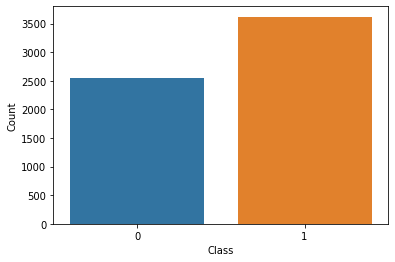

In [13]:
# Plot the occurrences of each class in miniall dataset

class_df = pd.DataFrame({'Class': data['occu'].value_counts().index,
                     'Count': data['occu'].value_counts()})

#print(class_df)
sns.barplot(x=class_df['Class'], y=class_df['Count'])
plt.show()

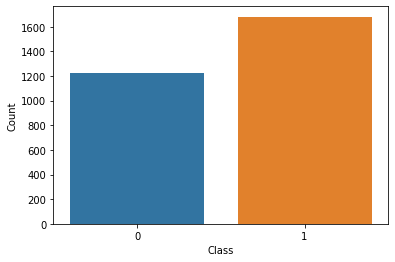

In [14]:
# Plot the occurrences of each class in training dataset

class_df = pd.DataFrame({'Class': data_train['labels'].value_counts().index,
                     'Count': data_train['labels'].value_counts()})

#print(class_df)
sns.barplot(x=class_df['Class'], y=class_df['Count'])
plt.show()

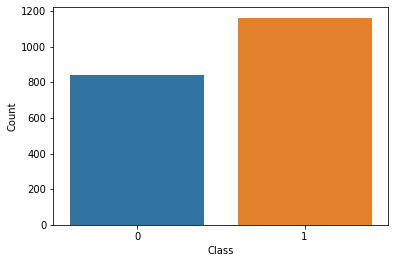

In [15]:
# Plot the occurrences of each class in test dataset

class_df = pd.DataFrame({'Class': data_test['labels'].value_counts().index,
                     'Count': data_test['labels'].value_counts()})

#print(class_df)
sns.barplot(x=class_df['Class'], y=class_df['Count'])
plt.show()

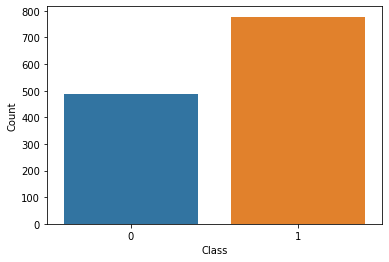

In [16]:
# Plot the occurrences of each class in validation dataset

class_df = pd.DataFrame({'Class': data_val['labels'].value_counts().index,
                     'Count': data_val['labels'].value_counts()})

#print(class_df)
sns.barplot(x=class_df['Class'], y=class_df['Count'])
plt.show()

# Let's display some images

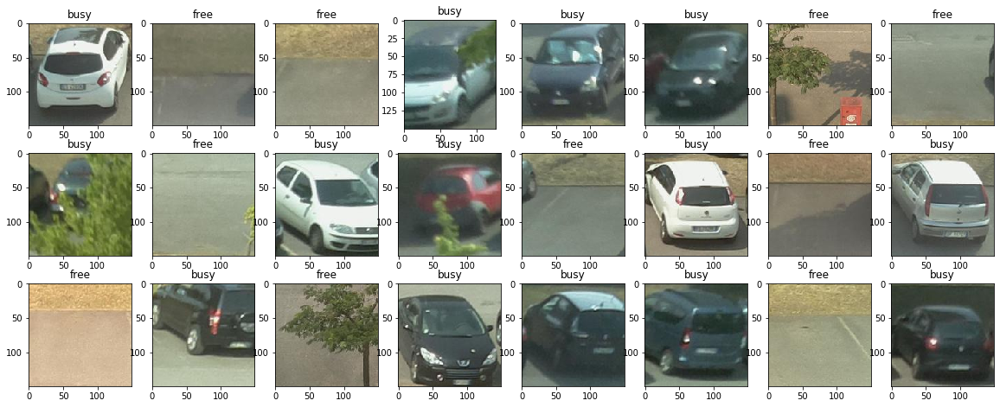

In [17]:
np.random.seed(8675309)
%matplotlib inline

# Display image previews below
plt.figure(figsize=(20,55))
columns = 8
n = 1

# Randomly choose some images to display (with label)
for image_path in np.random.choice(data_train['features'], 24, replace=False): 
    mesg = image_path.find("/")
    mesg2 = image_path[mesg:]
    title = mesg2[1:5]
        
    #image_path='./CNRParkAB/'+image_path
    image_path=data_dir+image_path
    img = image.load_img(image_path)
    plt.subplot(20, columns, n)
    n+=1
    plt.imshow(img)
    plt.title(title)


# Preparing the model

In [18]:
from keras.preprocessing import image                  
from tqdm import tqdm

ImageFile.LOAD_TRUNCATED_IMAGES = True 

# Manually set if the data is RGB
is_rgb = True

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [19]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# pre-process the data for Keras
train_tensors = paths_to_tensor(data_train['features']).astype('float32')/255

test_tensors = paths_to_tensor(data_test['features'],).astype('float32')/255

valid_tensors = paths_to_tensor(data_val['features']).astype('float32')/255

100%|██████████| 1267/1267 [00:02<00:00, 521.50it/s]


# Pre-process the dataset

In [21]:
import tensorflow as tf
import keras
from tensorflow.contrib.layers import flatten
from math import ceil
from sklearn.utils import shuffle

data_train_rgb = data_train['features']
data_test_rgb = data_test['features']

In [22]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D,BatchNormalization
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

print(n_classes)

model = Sequential()
model.add(Conv2D(filters=3,kernel_size=5, padding='same', activation='relu', input_shape=(224,224,3), kernel_initializer='glorot_normal'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=3, kernel_size=5, padding='same', activation='relu', input_shape=(224,224,3), kernel_initializer='glorot_normal'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=3, kernel_size=5, padding='same', activation='relu', input_shape=(224,224,3), kernel_initializer='glorot_normal'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=2))
model.add(Dense(3, activation='relu', kernel_initializer='glorot_normal'))
model.add(Dense(2, activation='relu', kernel_initializer='glorot_normal'))
model.add(Flatten())
model.add(Dense(64, activation='softmax', kernel_initializer='glorot_normal'))
model.add(Dense(1, activation='softmax', kernel_initializer='glorot_normal'))

model.summary()

2
Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 224, 224, 3)       228       
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 3)       12        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 112, 112, 3)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 112, 112, 3)       228       
_________________________________________________________________
batch_normalization_2 (Batch (None, 112, 112, 3)       12        
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 3)         0         
_________________________________________________________________
co

# Compile the model

In [23]:
#model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])
model.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])

# Train the model

In [28]:
from keras.callbacks import ModelCheckpoint  

print("train_tensors",train_tensors.shape)
print("y_train", y_train.shape)

#epochs = 12
epochs = 2
batch_size = 40

### Do NOT modify the code below this line.

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5', verbose=1, save_best_only=True)

#print(X_train.shape[0])
#print(y_train.shape[0])

#print(y_train)
model.fit(train_tensors, y_train, validation_data=(valid_tensors, y_valid),epochs=epochs,batch_size=batch_size, callbacks=[checkpointer], verbose=1)


train_tensors (2904, 224, 224, 3)
y_train (2904,)
Instructions for updating:
Use tf.cast instead.
Train on 2904 samples, validate on 1267 samples
Epoch 1/2
2904/2904 [==============================] - 76s 26ms/step - loss: 6.7140 - acc: 0.5789 - val_loss: 6.1530 - val_acc: 0.6140

Epoch 00001: val_loss improved from inf to 6.15298, saving model to saved_models/weights.best.from_scratch.hdf5
Epoch 2/2
2904/2904 [==============================] - 79s 27ms/step - loss: 6.7140 - acc: 0.5789 - val_loss: 6.1530 - val_acc: 0.6140

Epoch 00002: val_loss did not improve from 6.15298


# Load the Model with the Best Validation Loss

In [29]:
model.load_weights('saved_models/weights.best.from_scratch.hdf5')

# Test the Model

In [30]:
predictions = [model.predict(np.expand_dims(tensor, axis=0))[0] for tensor in valid_tensors]

In [31]:
#accuracy 0.6140 7 epochs 6.15

print(len(predictions))
print(len(test_tensors))
#predictions

score = model.evaluate(valid_tensors, y_valid, verbose=1)
print("Accuracy: ", score[1])
#data_val
# Checking the predictions
print("\nPredictions:")
print(model.predict(test_tensors))
#print (predictions[10])

1267
2000
1267/1267 [==============================] - 12s 9ms/step
Accuracy:  0.6140489344438795

Predictions:
[[1.]
 [1.]
 [1.]
 ...
 [1.]
 [1.]
 [1.]]


#Train a CNN with Transfer Learning - Part1

# Use a pre-trained Coco based model 
Mask R-CNN model

In [21]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt
import cv2

# Root directory of the project
ROOT_DIR1 = os.path.abspath("./CNRPark-EXT/")
ROOT_DIR2 = os.path.abspath("./Mask_RCNN-master")
#print (ROOT_DIR)

# Import Mask RCNN
sys.path.append(ROOT_DIR2)  # To find local version of the library
import mrcnn.config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR2, "samples/coco/"))  # To find local version
import coco

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR2, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR2, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR2, "new_images")

In [22]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [23]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


In [24]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [25]:
import os, glob

def show_images(images, cmap=None):
    cols = 2
    rows = (len(images)+1)//cols    
    plt.figure(figsize=(15, 12))    
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

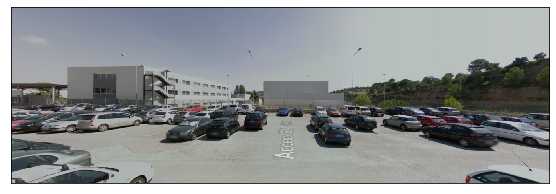

In [49]:
#cwd = os.getcwd()
#print (cwd)
orig_image = [plt.imread(path) for path in glob.glob('./Mask_RCNN-master/new_images/parking_cross_full3.jpg')]
show_images(orig_image)

In [50]:
# Filter a list of Mask R-CNN detection results to get only the detected cars / trucks
def get_car_boxes(boxes, class_ids):
    car_boxes = []

    for i, box in enumerate(boxes):
        # If the detected object isn't a car / truck, skip it
        if class_ids[i] in [3, 8, 6]:
            car_boxes.append(box)

    return np.array(car_boxes)

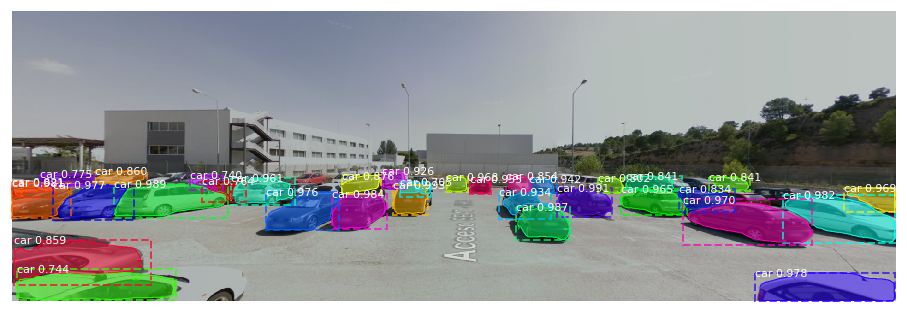

There are 33 parked cars


In [51]:
# Load an image from the images folder
file_name = os.path.join(IMAGE_DIR, "../new_images/parking_cross_full3.jpg")
image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")



# Detect Parking lots

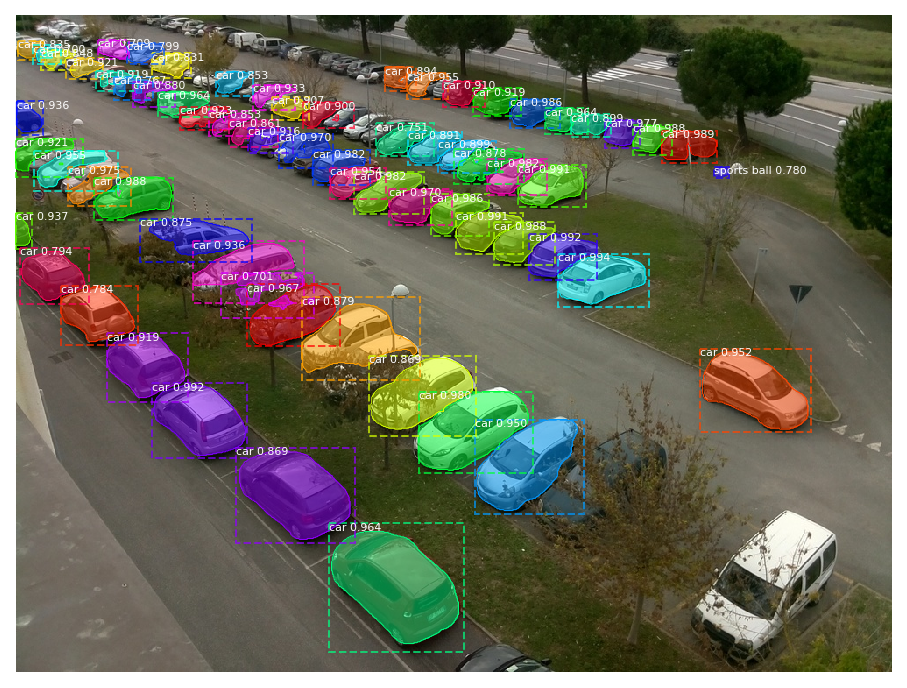

There are 66 parked cars


In [52]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "2015-11-16_1010.jpg")

#print(file_name)
image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")

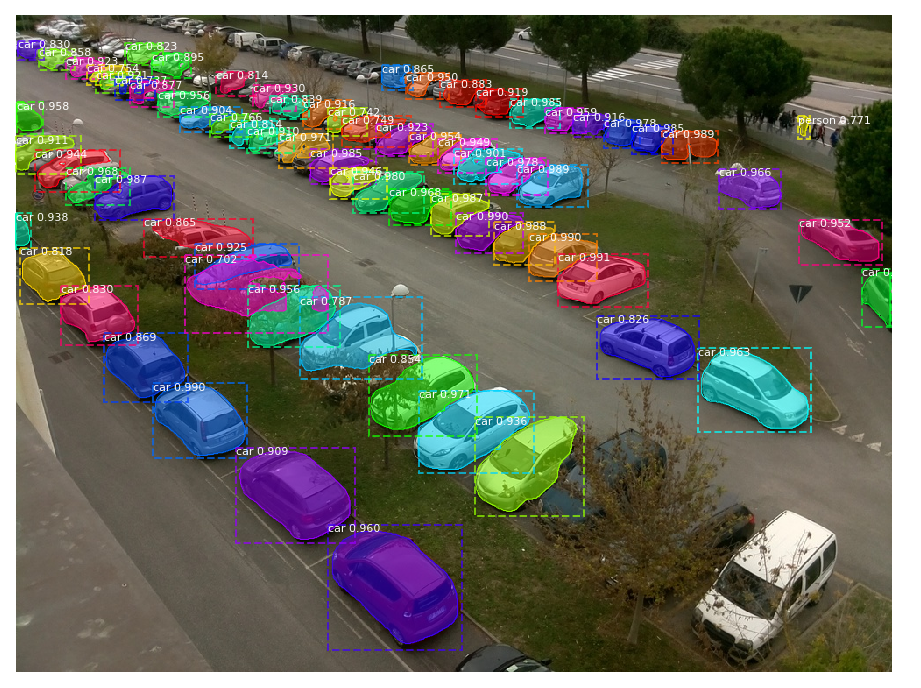

There are 71 parked cars


In [43]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "2015-11-16_1040.jpg")

#print(file_name)
image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")

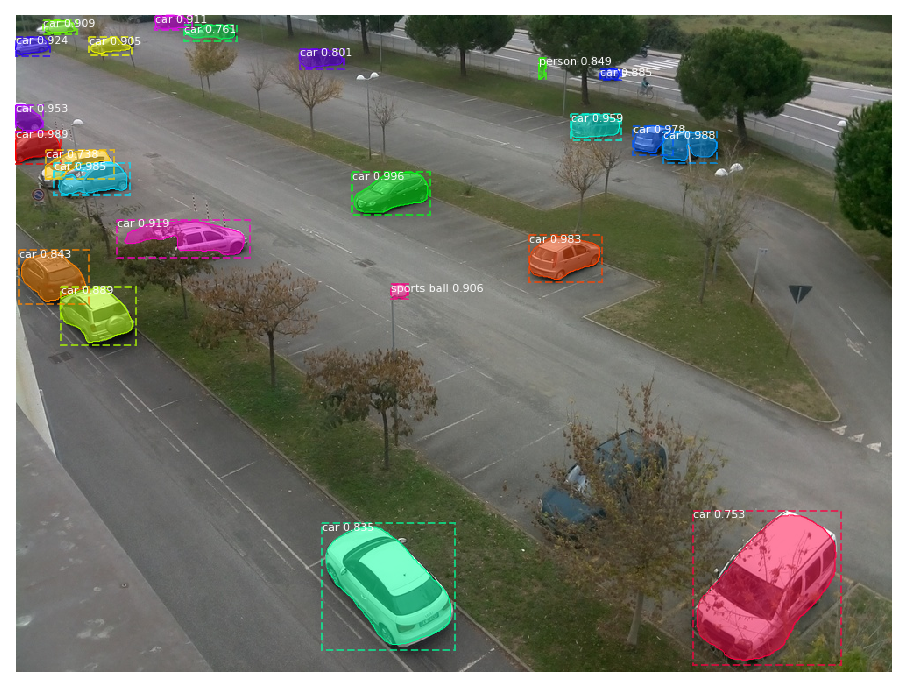

There are 21 parked cars


In [44]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "2015-11-16_0840.jpg")

#print(file_name)
image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")

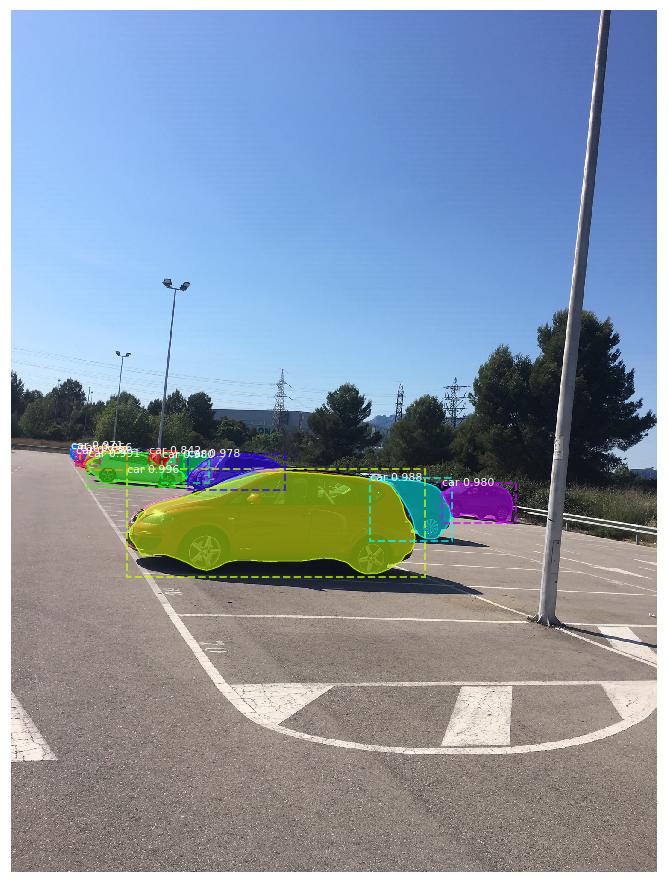

There are 10 parked cars


In [45]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "IMG_3084.JPG")

#print(file_name)
image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")

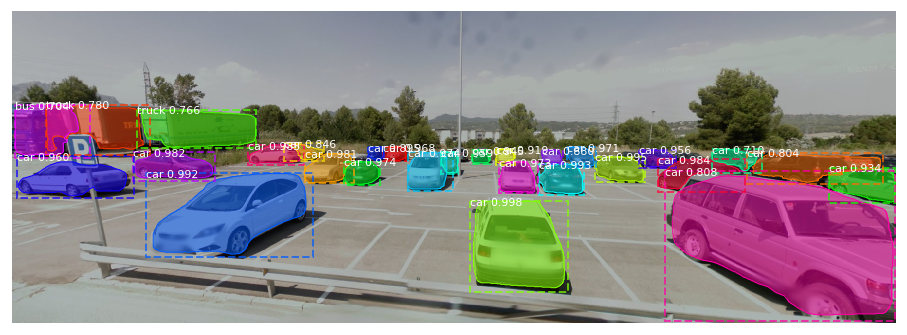

There are 28 parked cars


In [46]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "parking_cross_full4.jpg")

image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")

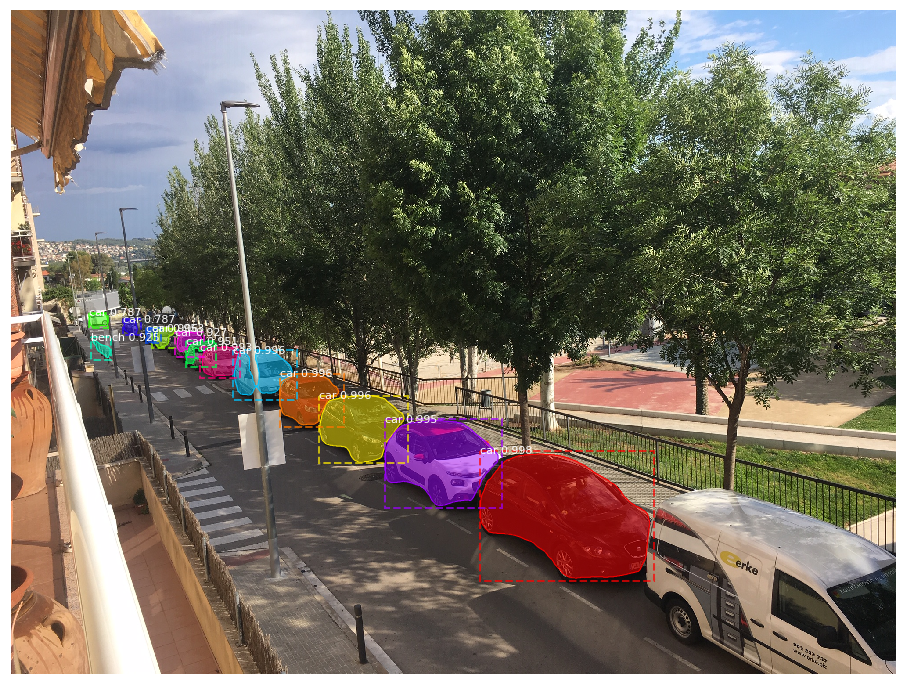

There are 12 parked cars


In [47]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "IMG_3017.JPG")

image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")

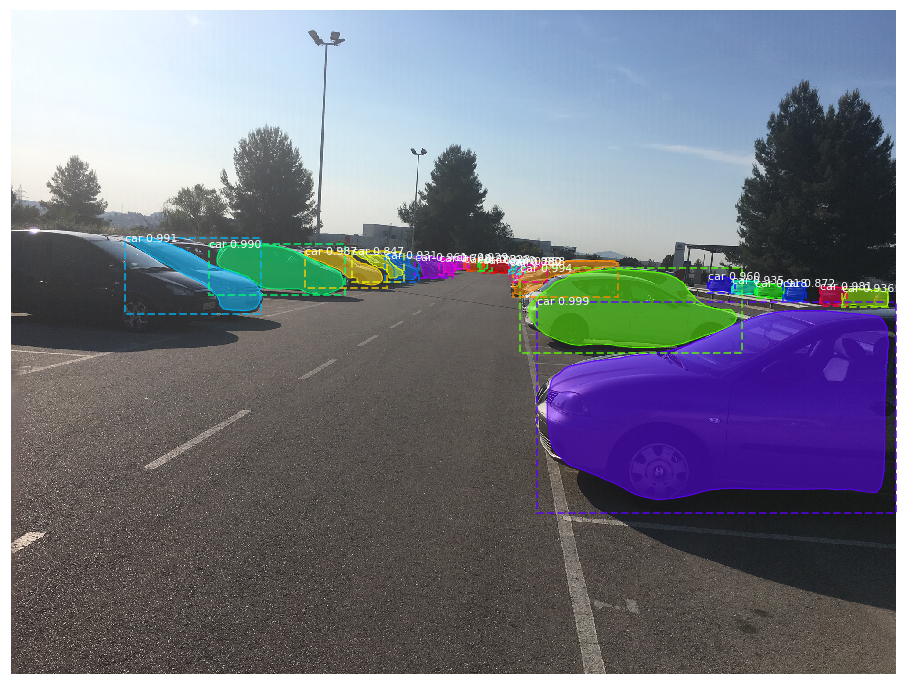

There are 22 parked cars


In [48]:
# Load an image from the images folder
cwd = os.getcwd()
file_name = os.path.join(IMAGE_DIR, "IMG_3080.JPG")

image = skimage.io.imread(os.path.join(file_name))

# Location of parking spaces
parked_car_boxes = None
# Run detection
results = model.detect([image], verbose=0)
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],  class_names, r['scores'])

if parked_car_boxes is None:     
    parked_car_boxes = get_car_boxes(r['rois'], r['class_ids'])
    print("There are", len(parked_car_boxes), "parked cars")
else:
     car_boxes = get_car_boxes(r['rois'], r['class_ids'])    
     overlaps = mrcnn.utils.compute_overlaps(parked_car_boxes, car_boxes)
     print ("There is free parking lot")